In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import zipfile as zip
import json as json

import seaborn as sns

%matplotlib inline

#%load_ext version_information

#### Import and extract Data

In [2]:
#ZipFile Pfad mit r davor um den Pfad als raw String einzulesen.
zip_file_path = "../../../Data/ZipFiles/foods-2011-10-03.json.zip"
#ZipFile wird geöffnet und nach "ZipFile\foods etx extrahiert"
with zip.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall('JsonFiles')

#Der Pfad der Extrahierten json Datei wird "gespeichert"
json_file_path = r"JsonFiles\foods-2011-10-03.json"

#Mit open() wird das jsonFile eingelesen und anschließend mit .load() in ein dataFrame geschrieben
with open(json_file_path, 'r') as json_file:
    data = json.load(json_file)
    

FileNotFoundError: [Errno 2] No such file or directory: '../../../Datenbanken/ZipFiles/foods-2011-10-03.json.zip'

#### data loaded

In [105]:
data

[{'id': 1008,
  'description': 'Cheese, caraway',
  'tags': [],
  'manufacturer': '',
  'group': 'Dairy and Egg Products',
  'portions': [{'amount': 1, 'unit': 'oz', 'grams': 28.35}],
  'nutrients': [{'value': 25.18,
    'units': 'g',
    'description': 'Protein',
    'group': 'Composition'},
   {'value': 29.2,
    'units': 'g',
    'description': 'Total lipid (fat)',
    'group': 'Composition'},
   {'value': 3.06,
    'units': 'g',
    'description': 'Carbohydrate, by difference',
    'group': 'Composition'},
   {'value': 3.28, 'units': 'g', 'description': 'Ash', 'group': 'Other'},
   {'value': 376.0,
    'units': 'kcal',
    'description': 'Energy',
    'group': 'Energy'},
   {'value': 39.28,
    'units': 'g',
    'description': 'Water',
    'group': 'Composition'},
   {'value': 1573.0,
    'units': 'kJ',
    'description': 'Energy',
    'group': 'Energy'},
   {'value': 0.0,
    'units': 'g',
    'description': 'Fiber, total dietary',
    'group': 'Composition'},
   {'value': 673.0,


In [106]:
# Beliebiges Nahrungsmittel wählen

randomFood = data[200]

#Keys des ausgewählten Nahrungsmittels:
print(list(randomFood.keys()))

['id', 'description', 'tags', 'manufacturer', 'group', 'portions', 'nutrients']


In [107]:
#Nutrient Dictionary für randomFood extrahieren
nutrientDic = randomFood["nutrients"]

#Beliebiges Nutrient auswählen und anzeigen:
nutrientDic[10]

{'value': 554.0, 'units': 'kJ', 'description': 'Energy', 'group': 'Energy'}

#### Creating Pandas

In [108]:
info_data = []
list_arr_nutries_data = []
for item in data:
    info_data.append({
        'description': item['description'],
        'group': item.get('group'),
        'id': item.get('id'),
        'manufacturer': item.get('manufacturer'),
    })
    
    
    df_nutries_elm = pd.DataFrame(item.get('nutrients'))
    df_nutries_elm["id"] =  item.get('id')
    
    list_arr_nutries_data.append(df_nutries_elm)

df_info = pd.DataFrame(info_data)

df_info.head()
df_arr_nutries_data = pd.concat(list_arr_nutries_data)
df_arr_nutries_data.head()
df_arr_nutries_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 389355 entries, 0 to 49
Data columns (total 5 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   value        389355 non-null  float64
 1   units        389355 non-null  object 
 2   description  389355 non-null  object 
 3   group        389355 non-null  object 
 4   id           389355 non-null  int64  
dtypes: float64(1), int64(1), object(3)
memory usage: 17.8+ MB


#### Remove Duplicates

In [109]:
df_nutries_cleand = df_arr_nutries_data.drop_duplicates()
df_arr_nutries_data.info()

print(f"duplicates dropped {df_arr_nutries_data.size - df_nutries_cleand.size}")

<class 'pandas.core.frame.DataFrame'>
Index: 389355 entries, 0 to 49
Data columns (total 5 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   value        389355 non-null  float64
 1   units        389355 non-null  object 
 2   description  389355 non-null  object 
 3   group        389355 non-null  object 
 4   id           389355 non-null  int64  
dtypes: float64(1), int64(1), object(3)
memory usage: 17.8+ MB
duplicates dropped 70895


#### Rename Fields

In [110]:
df_nutries_cleand.rename(columns={"group": "group_nutrients", "description" : "description_nutrients"}, inplace=True)

C:\Users\johan\AppData\Local\Temp\ipykernel_22560\2456248434.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_nutries_cleand.rename(columns={"group": "group_nutrients", "description" : "description_nutrients"}, inplace=True)


In [111]:
df_nutries_cleand

,value,units,description_nutrients,group_nutrients,id
0,25.180,g,Protein,Composition,1008
1,29.200,g,Total lipid (fat),Composition,1008
2,3.060,g,"Carbohydrate, by difference",Composition,1008
3,3.280,g,Ash,Other,1008
4,376.000,kcal,Energy,Energy,1008
...,...,...,...,...,...
45,0.000,mcg,"Vitamin B-12, added",Vitamins,43546
46,0.000,mg,Cholesterol,Other,43546
47,0.072,g,"Fatty acids, total saturated",Other,43546
48,0.028,g,"Fatty acids, total monounsaturated",Other,43546


#### Merge DataFrames

In [112]:
df_data_merged = pd.merge(df_nutries_cleand, df_info, on="id", how="outer")

df_data_merged

,value,units,description_nutrients,group_nutrients,id,description,group,manufacturer
0,25.180,g,Protein,Composition,1008,"Cheese, caraway",Dairy and Egg Products,
1,29.200,g,Total lipid (fat),Composition,1008,"Cheese, caraway",Dairy and Egg Products,
2,3.060,g,"Carbohydrate, by difference",Composition,1008,"Cheese, caraway",Dairy and Egg Products,
3,3.280,g,Ash,Other,1008,"Cheese, caraway",Dairy and Egg Products,
4,376.000,kcal,Energy,Energy,1008,"Cheese, caraway",Dairy and Egg Products,
...,...,...,...,...,...,...,...,...
375171,0.000,mcg,"Vitamin B-12, added",Vitamins,93600,"Turtle, green, raw",Finfish and Shellfish Products,None
375172,50.000,mg,Cholesterol,Other,93600,"Turtle, green, raw",Finfish and Shellfish Products,None
375173,0.127,g,"Fatty acids, total saturated",Other,93600,"Turtle, green, raw",Finfish and Shellfish Products,None
375174,0.088,g,"Fatty acids, total monounsaturated",Other,93600,"Turtle, green, raw",Finfish and Shellfish Products,None


#### Create Zinc Dataframe

In [113]:
df_zink  = df_data_merged.query("description_nutrients == 'Zinc, Zn'")
df_zink.head()



,value,units,description_nutrients,group_nutrients,id,description,group,manufacturer
14,2.94,mg,"Zinc, Zn",Elements,1008,"Cheese, caraway",Dairy and Egg Products,
75,3.11,mg,"Zinc, Zn",Elements,1009,"Cheese, cheddar",Dairy and Egg Products,
151,3.75,mg,"Zinc, Zn",Elements,1018,"Cheese, edam",Dairy and Egg Products,
222,2.88,mg,"Zinc, Zn",Elements,1019,"Cheese, feta",Dairy and Egg Products,
293,3.00,mg,"Zinc, Zn",Elements,1025,"Spices, allspice, ground",Spices and Herbs,


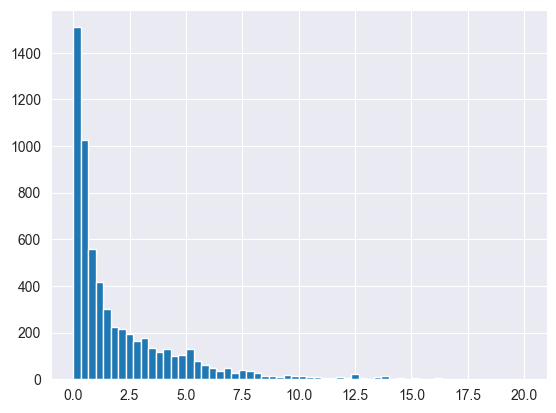

In [114]:
hist = df_zink["value"].hist(bins = 60,range=[0,20])

#### Data of the edam cheese

In [115]:
chees_edam = df_zink.loc[df_zink['description'] == "Cheese, edam"]
chees_edam.head()

,value,units,description_nutrients,group_nutrients,id,description,group,manufacturer
151,3.75,mg,"Zinc, Zn",Elements,1018,"Cheese, edam",Dairy and Egg Products,


#### Max Zinc and 75% quantile

In [116]:
print(f"75% quantil = {df_zink["value"].quantile(0.75)}")

max_zinc = df_zink.loc[df_zink["value"] == df_zink["value"].max(), ]
max_zinc.head()

75% quantil = 2.98


,value,units,description_nutrients,group_nutrients,id,description,group,manufacturer
208307,90.95,mg,"Zinc, Zn",Elements,15170,"Mollusks, oyster, eastern, canned",Finfish and Shellfish Products,


#### Food with less Zinc than Edam

In [117]:
zinc_lower_edam = df_zink.loc[df_zink["value"] < 3.75 ]
zinc_lower_edam

,value,units,description_nutrients,group_nutrients,id,description,group,manufacturer
14,2.94,mg,"Zinc, Zn",Elements,1008,"Cheese, caraway",Dairy and Egg Products,
75,3.11,mg,"Zinc, Zn",Elements,1009,"Cheese, cheddar",Dairy and Egg Products,
222,2.88,mg,"Zinc, Zn",Elements,1019,"Cheese, feta",Dairy and Egg Products,
293,3.00,mg,"Zinc, Zn",Elements,1025,"Spices, allspice, ground",Spices and Herbs,
370,2.92,mg,"Zinc, Zn",Elements,1026,"Spices, anise seed",Spices and Herbs,
...,...,...,...,...,...,...,...,...
374906,1.00,mg,"Zinc, Zn",Elements,80200,"Frog legs, raw",Finfish and Shellfish Products,None
374957,1.10,mg,"Zinc, Zn",Elements,83110,"Fish, mackerel, salted",Finfish and Shellfish Products,None
375015,1.55,mg,"Zinc, Zn",Elements,90240,"Mollusks, scallop, (bay and sea), cooked, steamed",Finfish and Shellfish Products,None
375092,1.00,mg,"Zinc, Zn",Elements,90560,"Mollusks, snail, raw",Finfish and Shellfish Products,None


In [ ]:
%version_information numpy,pandas